# **Reference:**
1. https://medium.com/datadriveninvestor/regression-from-scratch-wine-quality-prediction-d61195cb91c8

# **Importing Libraries**

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import random
from matplotlib import animation, rc
from matplotlib import cm

# **Loading Dataset**

In [0]:
X_df = pd.read_csv('linearX.csv')
Y_df = pd.read_csv('linearY.csv')
X = X_df.values
Y = Y_df.values
eta = [0.001,0.025,0.1]
X = X.ravel()
Y = Y.ravel()
global epochs
epochs = 5000 # 2000
global animation_frames
animation_frames = 20

# **Linear Regression Class Definition**

In [0]:
class Linear_Regression:
  
  def __init__(self, w_init, b_init, algo):
    self.w = w_init
    self.b = b_init
    self.w_h = []
    self.b_h = []
    self.e_h = []
    self.algo = algo
    
  def line_equation(self, x, w=None, b=None):
    if w is None:
      w = self.w
    if b is None:
      b = self.b
    return (w*x + b)
  
  def error(self, X, Y, w=None, b=None):
    if w is None:
      w = self.w
    if b is None:
      b = self.b
    err = 0
    for x, y in zip(X, Y):
      err += 0.5 * (self.line_equation(x, w, b) - y) ** 2
    return err
  
  def grad_w(self, x, y, w=None, b=None):
    if w is None:
      w = self.w
    if b is None:
      b = self.b
    y_pred = self.line_equation(x, w, b)
    return (y_pred - y)*x
  
  def grad_b(self, x, y, w=None, b=None):
    if w is None:
      w = self.w
    if b is None:
      b = self.b
    y_pred = self.line_equation(x, w, b)
    return (y_pred - y)
  
  def fit(self, X, Y, 
          epochs=100, eta=0.01, eps=1e-8,  
         ):
    self.w_h = []
    self.b_h = []
    self.e_h = []
    self.X = X
    self.Y = Y
    
    if self.algo == 'GD':
      for i in range(epochs):
        dw, db = 0, 0
        for x, y in zip(X, Y):
          dw += self.grad_w(x, y)
          db += self.grad_b(x, y)
        self.w -= eta * dw / X.shape[0]
        self.b -= eta * db / X.shape[0]
        self.append_log()
        if(len(self.e_h) > 2):
          if((self.e_h[-2]-self.e_h[-1])/self.e_h[-2] < 0.0001):
            break
        
        
  def append_log(self):
    self.w_h.append(self.w)
    self.b_h.append(self.b)
    self.e_h.append(self.error(self.X, self.Y))

# **Functions Definitions**

In [0]:
def plot_ewb(lr,eta):
  plt.subplot(3,1,1)
  plt.plot(lr.e_h, 'r')
  plt.ylabel("MSE")
  plt.subplot(3,1,2)
  plt.plot(lr.w_h, 'b')
  plt.ylabel("w")
  plt.subplot(3,1,3)
  plt.plot(lr.b_h, 'g')
  plt.ylabel("b")
#  plt.legend(["MSE","w","b"])
  plt.savefig("ewh_{}.png".format(eta))
  

def plot_result(X,Y,lr,eta):
  plt.subplot(2,1,1)
  plt.scatter(X,Y)
  plt.ylabel("y")
  plt.xlabel("x")
  plt.subplot(2,1,2)
  plt.plot(X, X*lr.w + lr.b)
  plt.ylabel(r"$\hat{f}(x)$")
  plt.xlabel("x")
  plt.suptitle("Input Data and Fit Line")
  plt.savefig("results_{}.png".format(eta))

In [0]:
def Question_5(X,Y,epochs=100,eta=0.01):
  algo = 'GD'

  w_init = random.randrange(10)
  b_init = random.randrange(10)

  animation_frames = 20

  lr = Linear_Regression(w_init, b_init, algo)
  lr.fit(X, Y, epochs=epochs, eta=0.01)
  plot_ewb(lr,eta)
  plot_result(X,Y,lr,eta)
  return lr

In [0]:
def plot_2d(lr):
  w_min = min(lr.w_h[0],lr.w_h[-1])-1
  w_max = max(lr.w_h[0],lr.w_h[-1])+1

  b_min = min(lr.b_h[0],lr.b_h[-1])-1
  b_max = max(lr.b_h[0],lr.b_h[-1])+1

  W = np.linspace(w_min, w_max, 256)
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = lr.error(X, Y, WW, BB)

  fig = plt.figure(dpi=100)
  ax = plt.subplot(111)
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  title = ax.set_title('Epoch 0')
  cset = plt.contourf(WW, BB, Z, 25, alpha=0.6, cmap=cm.bwr)
  plt.show()

  def plot_animate_2d(i):
    i = int(i*(epochs/animation_frames))
    line.set_data(lr.w_h[:i+1], lr.b_h[:i+1])
    title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, lr.e_h[i]))
    return line, title

  i = 0
  line, = ax.plot(lr.w_h[:i+1], lr.b_h[:i+1], color='black',marker='.')
  anim = animation.FuncAnimation(fig, func=plot_animate_2d, frames=animation_frames)
  rc('animation', html='jshtml')
  return anim

In [0]:
def plot_3d(lr):
  w_min = min(lr.w_h[0],lr.w_h[-1])-1
  w_max = max(lr.w_h[0],lr.w_h[-1])+1

  b_min = min(lr.b_h[0],lr.b_h[-1])-1
  b_max = max(lr.b_h[0],lr.b_h[-1])+1

  W = np.linspace(w_min, w_max, 256)
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = lr.error(X, Y, WW, BB)

  fig = plt.figure(dpi=100)
  ax = fig.gca(projection='3d')
  surf = ax.plot_surface(WW, BB, Z, rstride=3, cstride=3, alpha=0.5, cmap=cm.coolwarm, linewidth=0, antialiased=False)
  cset = ax.contourf(WW, BB, Z, 25, zdir='z', offset=-1, alpha=0.6, cmap=cm.coolwarm)
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  ax.set_zlabel('error')
  ax.set_zlim(-1, np.max(Z))
  ax.view_init (elev=25, azim=-75) # azim = -20
  ax.dist=12  
  title = ax.set_title('Epoch 0')

  def plot_animate_3d(i):
    i = int(i*(epochs/animation_frames))
    line1.set_data(lr.w_h[:i+1], lr.b_h[:i+1])
    line1.set_3d_properties(lr.e_h[:i+1])
    line2.set_data(lr.w_h[:i+1], lr.b_h[:i+1])
    line2.set_3d_properties(np.zeros(i+1) - 1)
    title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, lr.e_h[i]))
    return line1, line2, title

  i = 0
  line1, = ax.plot(lr.w_h[:i+1], lr.b_h[:i+1], lr.e_h[:i+1], color='black',marker='.')
  line2, = ax.plot(lr.w_h[:i+1], lr.b_h[:i+1], np.zeros(i+1) - 1, color='red', marker='.')
  anim = animation.FuncAnimation(fig, func=plot_animate_3d, frames=animation_frames)
  rc('animation', html='jshtml')
  return anim

# **Theory**

**Learning rate:**

The learning rate is a tuning parameter in an optimization algorithm that determines the step size at each iteration while moving toward a minimum of a loss function. Since it influences to what extent newly acquired information overrides old information, it metaphorically represents the speed at which a machine learning model "learns".

**Weighing factors:** 

Each input in the feature vector is assigned its own relative weight ($w$), which decides the impact that the particular input needs in the summation function, i.e., some inputs are made more important than others by giving them more weight so that they have a greater effect in the summation function (y). A bias ($b$) is also added to the summation.

**General Line equation:**

The most general form of hypothesis function used in linear regression is: $w^Tx+b$.

**Loss Function:**

In order to fit the model to the data, the whole problem is converted into optimization problem by defining an error function and setting up a framework by which a reduction of the error function we obtain the best fit model to the input data. This way, we can make use of numerous fast optimization techniques to get the best fit model to the data.

# **Model Training and Evaluation**

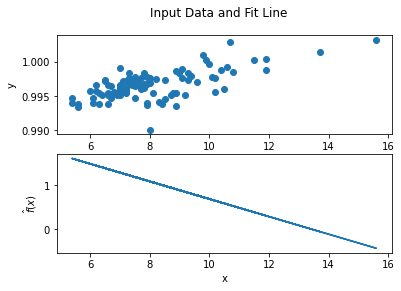

In [179]:
lr = Question_5(X,Y,epochs=epochs,eta=0.01)

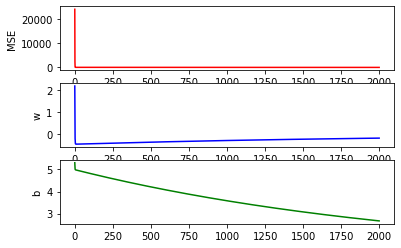

In [180]:
plot_ewb(lr,0.01)

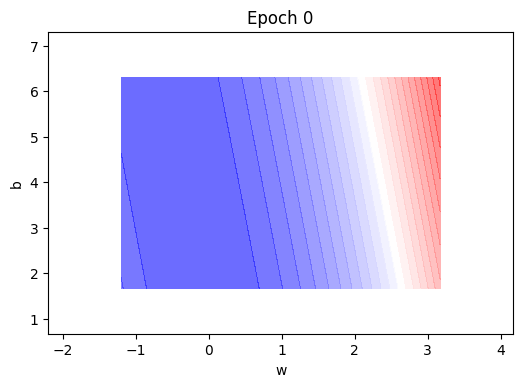

In [181]:
anim_2d = plot_2d(lr)

In [182]:
anim_2d

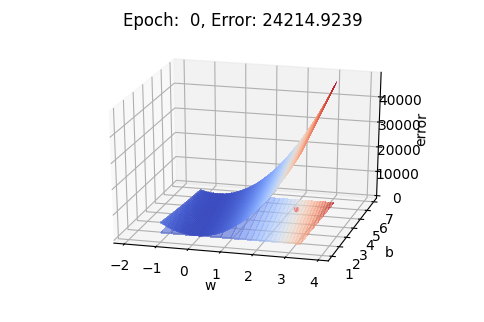

In [183]:
anim_3d = plot_3d(lr)

In [184]:
anim_3d

In [186]:
print("(w,b) = ({},{})".format(np.round(lr.w,3),np.round(lr.b,3)))

(w,b) = (-0.199,2.669)


## **Results Summary**

Statistics of results obtained above: 
1. The learning rate used = 0.01
2. Stopping Criteria = 
  
  a. % Relative decrease in error < 0.1 % or 

  b. number of iterations = epochs

3. Line equation = $w^Tx + b$

  a. $w = -0.199$

  b. $b = 2.669$ 

  Thus, hypothesis function learnt by the algorithm = $f(x) = -0.199x + 2.669$


We have set upper limit on number of iterations (by defining the maximum number of **epochs**), to prevent infinite looping.



# **Epochs = 2000**

## **Learning Rate = 0.001**

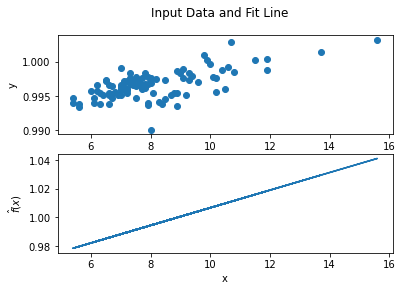

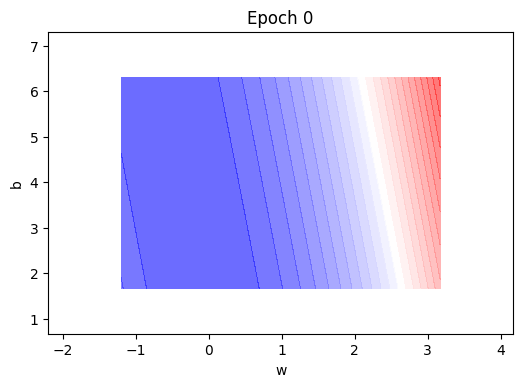

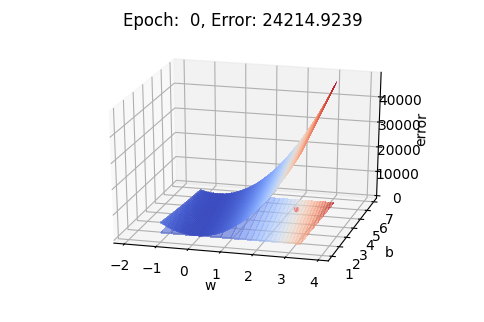

In [187]:
lr_0 = Question_5(X,Y,epochs=epochs,eta=eta[0])
anim_2d_0 = plot_2d(lr) 
anim_3d_0 = plot_3d(lr)

In [188]:
anim_2d_0

In [189]:
anim_3d_0

In [190]:
print("Final value of MSE for learning rate value of {} = {}".format(eta[0],np.round(lr_0.e_h[-1],3)))
print("Line Equation: wx+b = "+str(np.round(lr_0.w,3))+ "x " + str(np.round(lr_0.b,3)))

Final value of MSE for learning rate value of 0.001 = 0.005
Line Equation: wx+b = 0.006x 0.945


## **Learning Rate = 0.025**

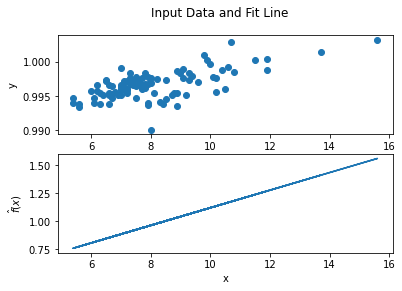

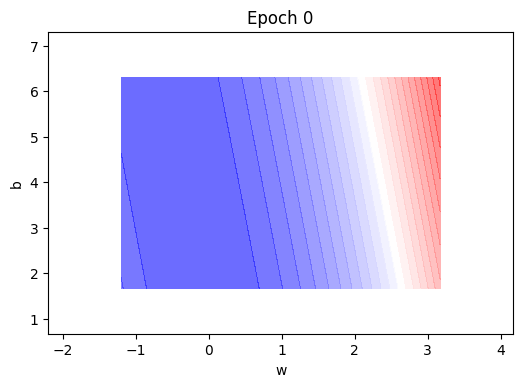

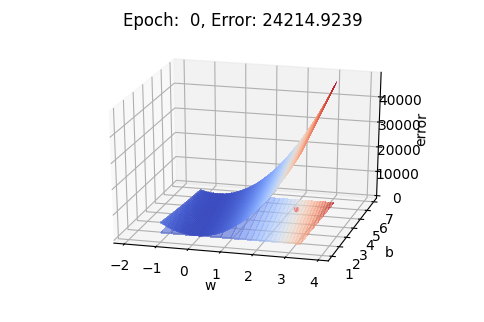

In [191]:
lr_1 = Question_5(X,Y,epochs=epochs,eta=eta[1])
anim_2d_1 = plot_2d(lr)
anim_3d_1 = plot_3d(lr)

In [192]:
anim_2d_1

In [193]:
anim_3d_1

In [194]:
print("Final value of MSE for learning rate value of {} = {}".format(eta[1],np.round(lr_1.e_h[-1],3)))
print("Line Equation: wx+b = "+str(np.round(lr_1.w,3))+ "x " + str(np.round(lr_1.b,3)))

Final value of MSE for learning rate value of 0.025 = 0.936
Line Equation: wx+b = 0.079x 0.335


## **Learning Rate = 0.1**

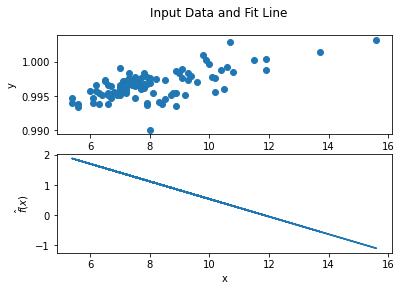

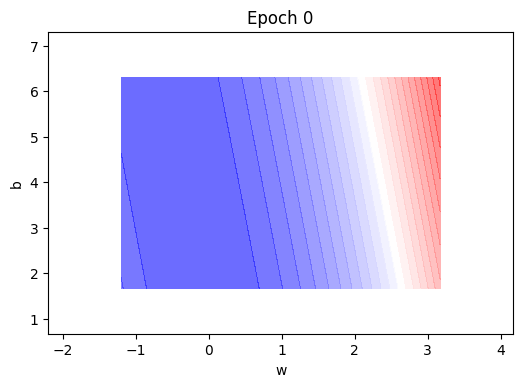

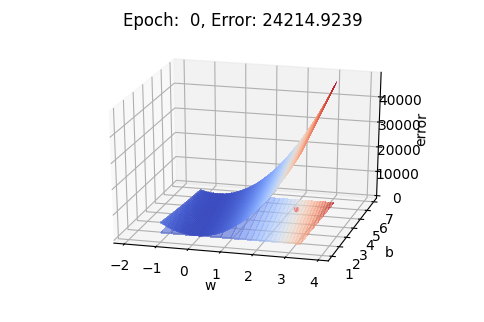

In [195]:
lr_2 = Question_5(X,Y,epochs=epochs,eta=eta[2])
anim_2d_2 = plot_2d(lr)
anim_3d_2 = plot_3d(lr)

In [196]:
anim_2d_2

In [197]:
anim_3d_2

In [198]:
print("Final value of MSE for learning rate value of {} = {}".format(eta[2],np.round(lr_2.e_h[-1],3)))
print("Line Equation: wx+b = "+str(np.round(lr_2.w,3))+ "x " + str(np.round(lr_2.b,3)))

Final value of MSE for learning rate value of 0.1 = 13.158
Line Equation: wx+b = -0.291x 3.446


# **Epochs = 5000**

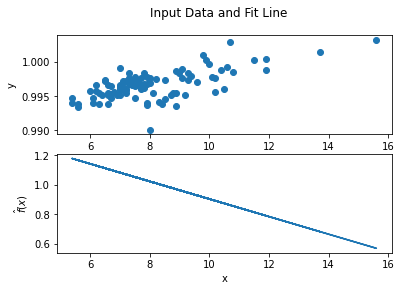

In [246]:
lr_3 = Question_5(X,Y,epochs=epochs,eta=0.01)

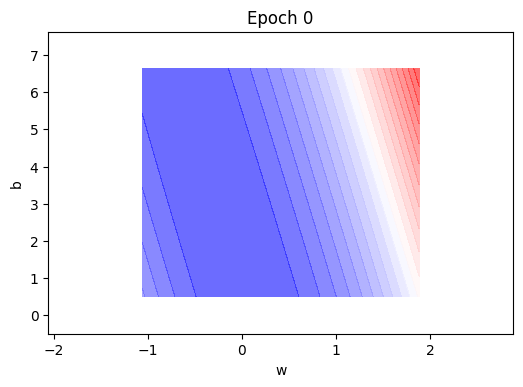

In [247]:
anim_2d_3 = plot_2d(lr_3)

In [248]:
anim_2d_3

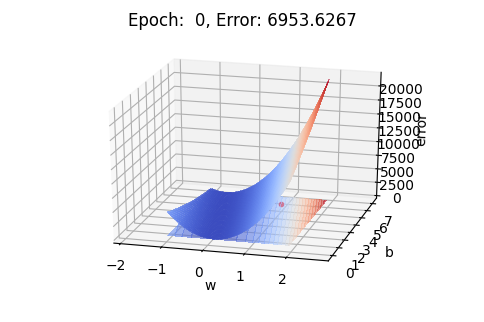

In [249]:
anim_3d_3 = plot_3d(lr_3)

In [250]:
anim_3d_3

In [251]:
print("Final value of MSE for learning rate value of {} = {}".format(0.01,np.round(lr_3.e_h[-1],3)))
print("Line Equation: wx+b = "+str(np.round(lr_3.w,3))+ "x " + str(np.round(lr_3.b,3)))

Final value of MSE for learning rate value of 0.01 = 0.565
Line Equation: wx+b = -0.06x 1.499


## **Learning Rate = 0.001**

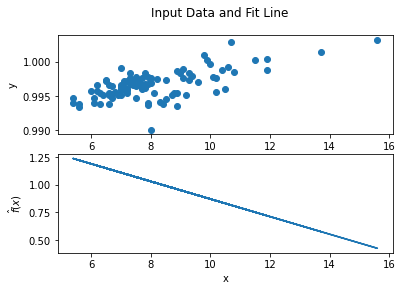

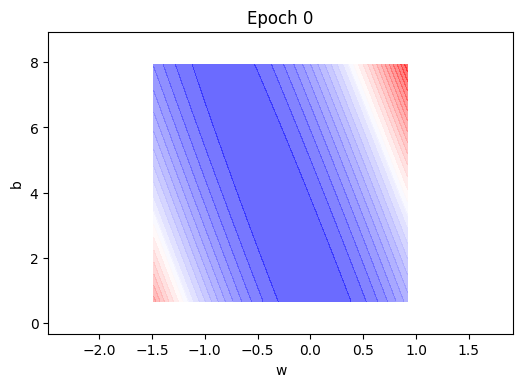

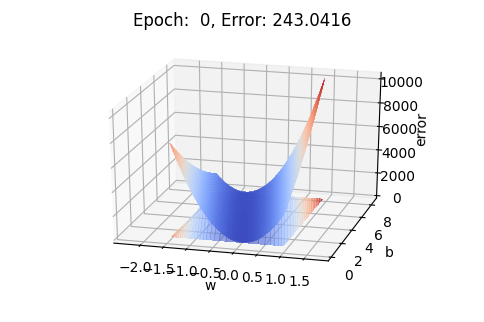

In [227]:
lr_4 = Question_5(X,Y,epochs=epochs,eta=eta[0])
anim_2d_4 = plot_2d(lr_4)
anim_3d_4 = plot_3d(lr_4)

In [228]:
anim_2d_4

In [229]:
anim_3d_4

In [242]:
print("Final value of MSE for learning rate value of {} = {}".format(eta[0],np.round(lr_4.e_h[-1],3)))
print("Line Equation: wx+b = "+str(np.round(lr_4.w,3))+ "x " + str(np.round(lr_4.b,3)))

Final value of MSE for learning rate value of 0.001 = 0.993
Line Equation: wx+b = -0.079x 1.665


## **Learning Rate = 0.025**

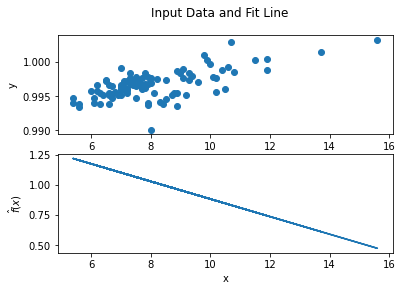

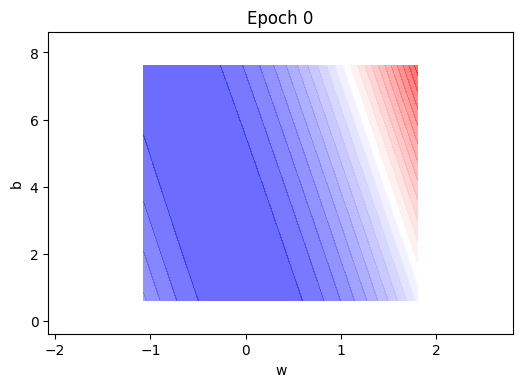

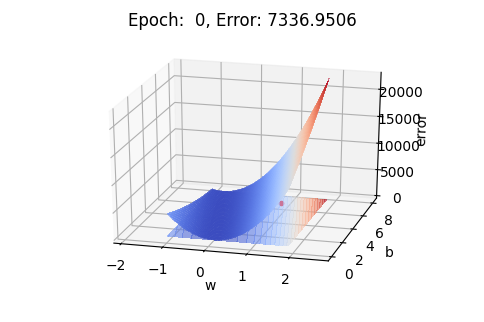

In [230]:
lr_5 = Question_5(X,Y,epochs=epochs,eta=eta[1])
anim_2d_5 = plot_2d(lr_5)
anim_3d_5 = plot_3d(lr_5)

In [231]:
anim_2d_5

In [233]:
anim_3d_5

In [241]:
print("Final value of MSE for learning rate value of {} = {}".format(eta[1],np.round(lr_5.e_h[-1],3)))
print("Line Equation: wx+b = "+str(np.round(lr_5.w,3))+ "x " + str(np.round(lr_5.b,3)))

Final value of MSE for learning rate value of 0.025 = 0.842
Line Equation: wx+b = -0.073x 1.612


## **Learning Rate = 0.1**

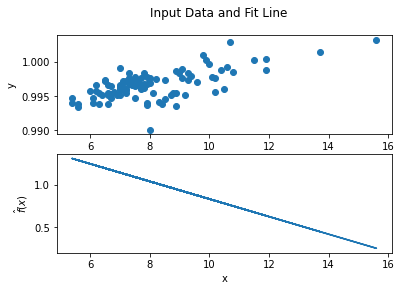

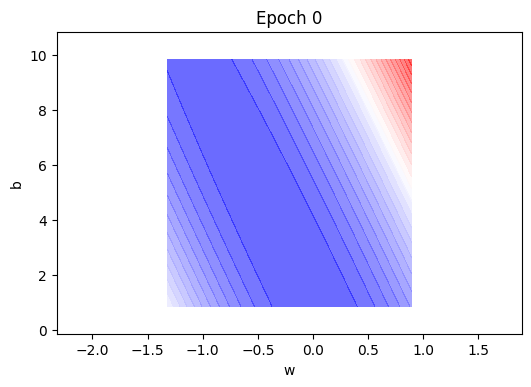

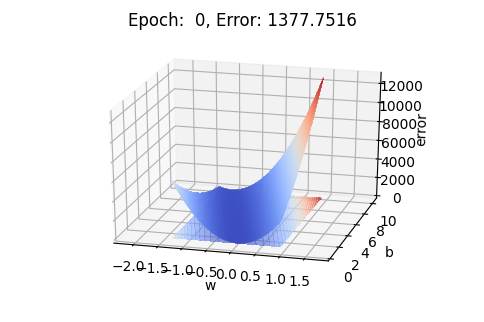

In [237]:
lr_6 = Question_5(X,Y,epochs=epochs,eta=eta[2])
anim_2d_6 = plot_2d(lr_6)
anim_3d_6 = plot_3d(lr_6)

In [238]:
anim_2d_6

In [239]:
anim_3d_6

In [240]:
print("Final value of MSE for learning rate value of {} = {}".format(eta[2],np.round(lr_6.e_h[-1],3)))
print("Line Equation: wx+b = "+str(np.round(lr_6.w,3))+ "x " + str(np.round(lr_6.b,3)))

Final value of MSE for learning rate value of 0.1 = 1.711
Line Equation: wx+b = -0.104x 1.876


# **Summary**

In [0]:
df = pd.DataFrame({'0.001': [lr_0.e_h[-1], lr_5.e_h[-1]],
                   '0.025': [lr_1.e_h[-1], lr_4.e_h[-1]],
                   '0.01': [lr.e_h[-1], lr_3.e_h[-1]],
                    '0.1': [lr_2.e_h[-1], lr_6.e_h[-1]]},
                  index=['2000', '5000'])

In [253]:
df

,0.001,0.025,0.01,0.1
2000,0.004548,0.935902,6.144117,13.158141
5000,0.841982,0.992759,0.565245,1.711458


# **Inference**

1. We observe that the mean squared error reduces with decrease in the learning rate.

2. Also, we observe the effect of the learning rate on the step size through the animations presented above. With increase in the value of the learning rate, the step size increases. 

3. There are more over shoots in case of higher value of learning rate but in no case is the under shoot or back step observed.

4. We have also studied the effect of number of epochs on the error value. At (here, relatively) lower number of epochs, the MSE decreases with decrease in learning rate. In case of higher number of epochs, we observe an drastic decrease in the MSE at a learning rate of 0.01 and increases at 0.025, which can be considered as an outlier.

